# Chopin Score Network

This notebook learns the Chopin Nocturne in C# minor as a time-conditioned score-reconstruction problem.

Architecture used here: Fourier time embeddings -> residual MLP -> one sigmoid head per pitch.
That is the right fit for a single fixed MIDI file because the network only needs to learn the score as a function of absolute time.

Expected runtime: under 10 minutes on CPU; the model here is intentionally small so it can overfit the piece quickly.

**Model overview (detailed)**

Below is a precise description of the trained model and the preprocessing pipeline used in this notebook.

- Features:
  - Temporal grid: resolution = 20 ms (0.02 s) time bins across the whole MIDI piece.
  - Fourier time embeddings: relative phase (t/T) plus sin/cos harmonics k=1..12. Optionally includes beat-phase sin/cos computed from the MIDI BPM.
  - Resulting feature vector per time-step: ~27 dims (depends on harmonic count and BPM inclusion).

- Network architecture (see diagram below):
  - Input: time-embedding vector (n_features).
  - Stem: Dense(256) → GELU → LayerNorm.
  - Residual body: 3 × ResidualBlock(width=256) where ResidualBlock = Dense(width) → GELU → LayerNorm → Dense(width) → GELU + skip.
  - Head: Dense(width//2) → GELU → Dense(n_pitches) producing raw logits (one per pitch).
  - Output: Sigmoid applied to logits to get per-frame pitch probabilities.

- Loss & training:
  - Loss: Weighted binary cross-entropy on each frame/pitch with positive-class weighting to counter sparsity.
  - Optimiser: Adam (lr=1e-3), early stopping on validation loss.

- Postprocessing:
  - Frame threshold selected by grid-search to maximise flattened F1.
  - Binary piano-roll → group contiguous frames into note events → convert to `NoteEvent` for synthesis.

Notes:
- `n_pitches` is the number of unique pitches in the MIDI (here ~56). The network therefore outputs a 56-dim vector per 20 ms frame.
- This design is compact and fast to train because the mapping is deterministic (one piece) and time-conditioned; it is not intended to generalise to arbitrary new pieces without retraining or architectural changes (e.g., sequence models or score-conditioned decoders).



In [14]:
import sys, time
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display

sys.path.insert(0, str(Path('..').resolve()))

from chopin_score_net import (
    build_score_dataset,
    train_score_model,
    predict_probabilities,
    best_threshold,
    score_to_events,
    evaluate_reconstruction,
    render_audio,
)

plt.rcParams.update({'figure.figsize': (12, 4), 'axes.grid': True, 'grid.alpha': 0.3})
MIDI_PATH = Path('../../shared/examples/chopin_nocturne_op_posth_csharp_minor.mid')
OUTDIR = Path('step_outputs')
OUTDIR.mkdir(exist_ok=True)
print(MIDI_PATH.resolve())

/Users/vghayoomie/git/wormuse/shared/examples/chopin_nocturne_op_posth_csharp_minor.mid


## Architecture comparison

The worm model is a **causal simulator**: command neurons, motor neurons, muscles, and onset detection form a time-evolving biophysical chain. The new Chopin model is a **direct score model**: it does not simulate biology at all; instead it learns a function from absolute time to a full pitch-vector for the fixed MIDI score.

That difference matters:
- The worm architecture must respect state, delay, and refractoriness.
- The score network only needs to memorize and interpolate a single piece, so time embeddings + a residual MLP are sufficient.
- In other words, the worm is a dynamical system; the score net is a conditional function approximator.

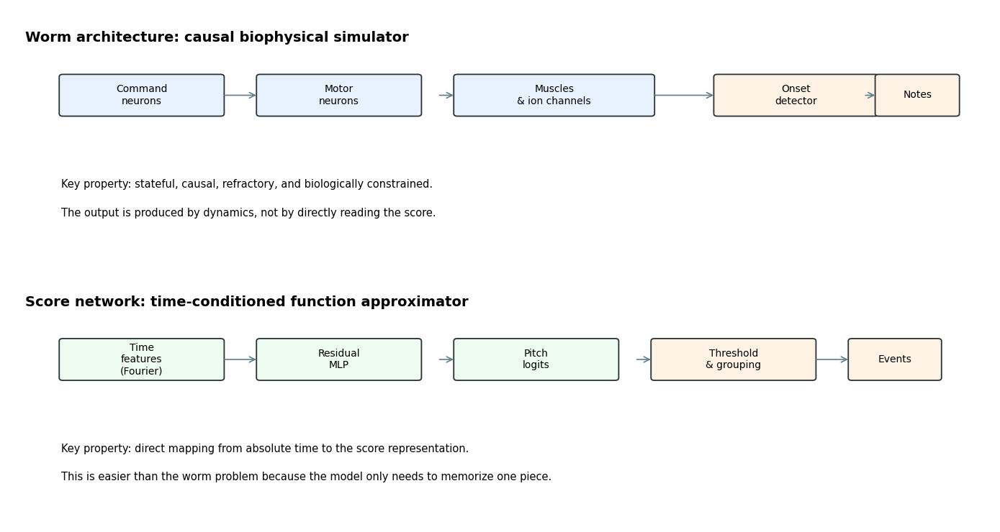

In [10]:
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch


def draw_box(ax, xy, text, width=1.8, height=0.62, fc='#f3f5f7', ec='#263238', fontsize=10):
    box = FancyBboxPatch(
        xy, width, height,
        boxstyle='round,pad=0.02,rounding_size=0.04',
        linewidth=1.3, edgecolor=ec, facecolor=fc,
    )
    ax.add_patch(box)
    ax.text(xy[0] + width / 2, xy[1] + height / 2, text, ha='center', va='center', fontsize=fontsize)


def arrow(ax, start, end, color='#607d8b'):
    ax.add_patch(FancyArrowPatch(start, end, arrowstyle='->', mutation_scale=14, linewidth=1.2, color=color))


fig, axes = plt.subplots(2, 1, figsize=(14, 7.5))

# Worm architecture
ax = axes[0]
ax.set_axis_off()
ax.set_xlim(0, 11)
ax.set_ylim(0, 4)
ax.text(0.2, 3.45, 'Worm architecture: causal biophysical simulator', fontsize=14, fontweight='bold')
draw_box(ax, (0.6, 2.3), 'Command\nneurons', fc='#e8f2ff')
draw_box(ax, (2.8, 2.3), 'Motor\nneurons', fc='#e8f2ff')
draw_box(ax, (5.0, 2.3), 'Muscles\n& ion channels', fc='#e8f2ff', width=2.2)
draw_box(ax, (7.9, 2.3), 'Onset\ndetector', fc='#fff3e6')
draw_box(ax, (9.7, 2.3), 'Notes', fc='#fff3e6', width=0.9)
arrow(ax, (2.4, 2.61), (2.8, 2.61))
arrow(ax, (4.8, 2.61), (5.0, 2.61))
arrow(ax, (7.2, 2.61), (7.9, 2.61))
arrow(ax, (9.55, 2.61), (9.7, 2.61))
ax.text(0.6, 1.15, 'Key property: stateful, causal, refractory, and biologically constrained.', fontsize=10.5)
ax.text(0.6, 0.7, 'The output is produced by dynamics, not by directly reading the score.', fontsize=10.5)

# Score network
ax = axes[1]
ax.set_axis_off()
ax.set_xlim(0, 11)
ax.set_ylim(0, 4)
ax.text(0.2, 3.45, 'Score network: time-conditioned function approximator', fontsize=14, fontweight='bold')
draw_box(ax, (0.6, 2.3), 'Time\nfeatures\n(Fourier)', fc='#eefbf1')
draw_box(ax, (2.8, 2.3), 'Residual\nMLP', fc='#eefbf1')
draw_box(ax, (5.0, 2.3), 'Pitch\nlogits', fc='#eefbf1')
draw_box(ax, (7.2, 2.3), 'Threshold\n& grouping', fc='#fff3e6')
draw_box(ax, (9.4, 2.3), 'Events', fc='#fff3e6', width=1.0)
arrow(ax, (2.4, 2.61), (2.8, 2.61))
arrow(ax, (4.8, 2.61), (5.0, 2.61))
arrow(ax, (7.0, 2.61), (7.2, 2.61))
arrow(ax, (9.0, 2.61), (9.4, 2.61))
ax.text(0.6, 1.15, 'Key property: direct mapping from absolute time to the score representation.', fontsize=10.5)
ax.text(0.6, 0.7, 'This is easier than the worm problem because the model only needs to memorize one piece.', fontsize=10.5)

plt.tight_layout()
plt.show()

BPM: 50.0
Time bins: 11711
Unique pitches: 56
Feature shape: (11711, 27)
Target roll shape: (11711, 56)


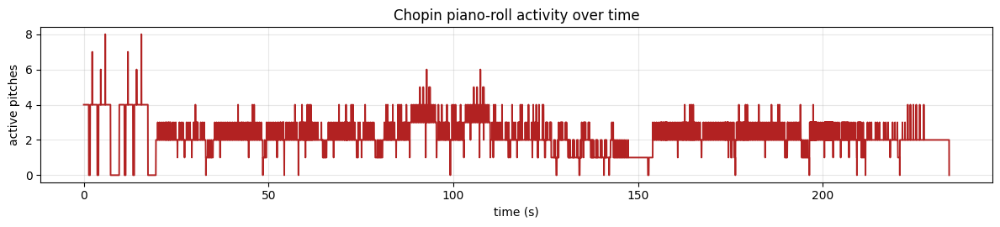

In [4]:
dataset = build_score_dataset(MIDI_PATH, resolution_s=0.02, n_harmonics=12)
print(f'BPM: {dataset.bpm:.1f}')
print(f'Time bins: {len(dataset.times)}')
print(f'Unique pitches: {len(dataset.pitches)}')
print(f'Feature shape: {dataset.features.shape}')
print(f'Target roll shape: {dataset.target_roll.shape}')

active_counts = dataset.target_roll.sum(axis=1)
fig, ax = plt.subplots(figsize=(12, 2.8))
ax.plot(dataset.times, active_counts, color='firebrick', lw=1.4)
ax.set(xlabel='time (s)', ylabel='active pitches', title='Chopin piano-roll activity over time')
plt.tight_layout()
plt.show()

epoch   1  train=0.89138  val=0.54185
epoch  25  train=0.04095  val=0.05126
epoch  50  train=0.02705  val=0.02965
epoch  75  train=0.03037  val=0.03674
early stop at epoch 75  val=0.03674
Training time: 110.5 s


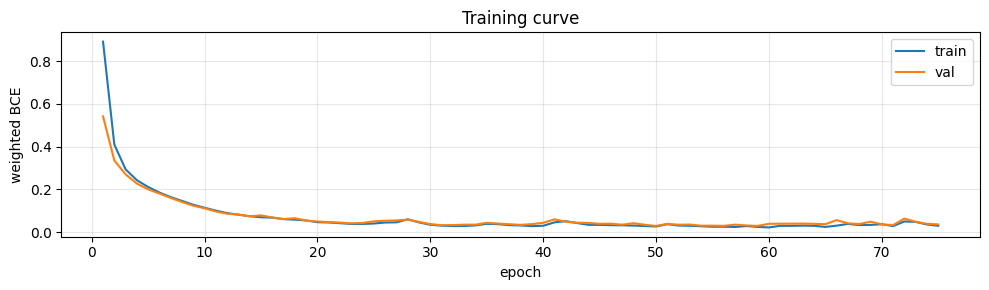

In [5]:
t0 = time.perf_counter()
model, params, history = train_score_model(
    dataset.features,
    dataset.target_roll,
    width=256,
    depth=3,
    lr=1e-3,
    epochs=200,
    batch_size=512,
    patience=25,
    verbose=True,
)
elapsed = time.perf_counter() - t0
print(f'Training time: {elapsed:.1f} s')

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(history.epochs, history.train_loss, label='train')
ax.plot(history.epochs, history.val_loss, label='val')
ax.set(xlabel='epoch', ylabel='weighted BCE', title='Training curve')
ax.legend()
plt.tight_layout()
plt.show()

Best frame threshold: 0.90
Frame F1: 0.9505
Onset F1: 0.8528
Pitch-aware F1: 0.7865
Pitch-aware precision: 0.8829
Pitch-aware recall: 0.7090
Predicted events: 803


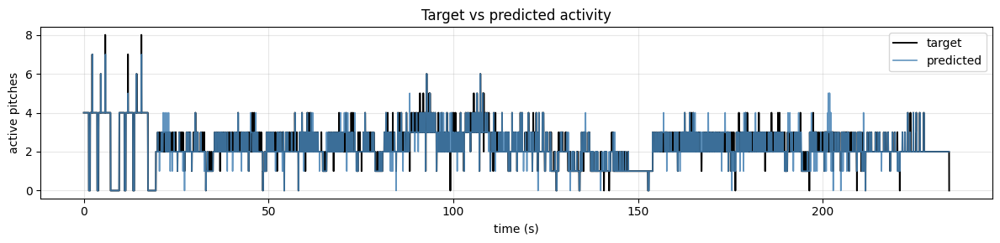

In [7]:
probs = predict_probabilities(model, params, dataset.features)
thr, frame_f1 = best_threshold(probs, dataset.target_roll)
pred_events = score_to_events(dataset.times, dataset.pitches, probs, threshold=thr, min_bins=2)
scores = evaluate_reconstruction(pred_events, dataset.events, dataset.duration_s)

print(f"Best frame threshold: {thr:.2f}")
print(f"Frame F1: {frame_f1:.4f}")
print(f"Onset F1: {scores['f1']['f1']:.4f}")
print(f"Pitch-aware F1: {scores['pitch_f1']['f1']:.4f}")
print(f"Pitch-aware precision: {scores['pitch_f1']['precision']:.4f}")
print(f"Pitch-aware recall: {scores['pitch_f1']['recall']:.4f}")
print(f"Predicted events: {len(pred_events)}")

pred_active = (probs >= thr).sum(axis=1)
true_active = dataset.target_roll.sum(axis=1)
fig, ax = plt.subplots(figsize=(12, 3))
ax.plot(dataset.times, true_active, label='target', color='black', lw=1.4)
ax.plot(dataset.times, pred_active, label='predicted', color='steelblue', lw=1.2, alpha=0.85)
ax.set(xlabel='time (s)', ylabel='active pitches', title='Target vs predicted activity')
ax.legend()
plt.tight_layout()
plt.show()

In [9]:
audio, fs = render_audio(
    pred_events,
    duration_s=dataset.duration_s,
    out_path=OUTDIR / 'chopin_score_net_reconstruction.wav',
)
display(Audio(audio, rate=fs, autoplay=False))
print('WAV saved to:', OUTDIR / 'chopin_score_net_reconstruction.wav')

WAV saved to: step_outputs/chopin_score_net_reconstruction.wav
